## Front Matter

CASA0013 - Introduction to Programming for Spatial Analysts

Title: Exploring price determinants of Airbnb listings based on a geographically weighted regression model: A spatial analysis in London

Student ID: 19178590

Word Count: 2391

# Reproducible Code

In [289]:
%load_ext autoreload
%autoreload 2

import pandas as pd 
import geopandas as gpd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as ctx

import io
import itertools
import os
import warnings

import re
import string
import json

from pysal.model import mgwr
from sklearn.preprocessing import StandardScaler

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from statsmodels.tools.tools import add_constant

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


* write constants and data load functions to utils.py

In [5]:
%%writefile utils.py
import os
import time
import re 
import pandas as pd 
import geopandas as gpd
import numpy as np

from requests import get
from urllib.parse import urlparse
# Constants ============================================
DATA_DIR = 'data'

# source directory
SRC_BNB = 'https://github.com/jreades/i2p/blob/master/data/clean/2020-08-24-listings.csv.gz?raw=true'
SRC_POI = 'https://github.com/AdamZhou3/London_Airbnb/blob/main/data/poi2020_09.zip?raw=true'
SRC_BOROS = 'https://github.com/jreades/i2p/blob/master/data/src/Boroughs.gpkg?raw=true'
SRC_POI_CLASS = 'https://github.com/AdamZhou3/London_Airbnb/blob/main/data/POI_CLSSIFICATION.csv?raw=true'

# destination directory
DEST_BNB = os.path.join(DATA_DIR)
DEST_POI = os.path.join(DATA_DIR)
DEST_BOROS  = os.path.join(DATA_DIR,'geo')
DEST_POI_CLASS = os.path.join(DATA_DIR)
#DEST_ROADNETWORK = os.path.join("data","open-roads_3828311","TQ_RoadLink.shp")

ROOM_TYPE = {
    'EnH':'Entire home/apt',
    'Pri':'Private room',
    'Sha':'Shared room ',
    'Hot':'Hotel room'
    }

# Functions ============================================
def set_proxy(port:int):
    '''
    set vpn for python environment if time zone is +8
    
    :param port: 
    :return  :
    '''
    tz = time.strftime('%z')
    if tz == "+0800": 
        os.environ['HTTP_PROXY'] = f'http://127.0.0.1:{port}'
        os.environ['HTTPS_PROXY'] = f'http://127.0.0.1:{port}'
        print("proxy setted")
    else:
        print(f"Time zone: {tz}")

## Load Data ==================================
def cache_data(src:str, dest:str)->str:
    '''
    copied from jon
    
    :param src: source url
    :param dest: destination directory
    :return dfn: destination directory + filename
    '''
    url = urlparse(src) # We assume that this is some kind of valid URL 
    fn  = os.path.split(url.path)[-1] # Extract the filename
    dfn = os.path.join(dest,fn) # Destination filename
    
    if not os.path.isfile(dfn):
        
        print(f"{dfn} not found, downloading!")
        path = os.path.split(dest)
        
        if len(path) >= 1 and path[0] != '':
            os.makedirs(os.path.join(*path), exist_ok=True)
            
        with open(dfn, "wb") as file:
            response = get(src)
            file.write(response.content)
            
        print(f"\tDone downloading.")

    else:
        print(f"Found {dfn} locally!")
        
    return dfn

def df_to_gdf(df, lon="longitude", lat="latitude",scproj='epsg:4326',proj='epsg:27700'):
    '''
    transform dataframe to geopandas dataframe
    
    :param scproj:source projection
    :param proj: target projection
    :return gdf: geodataframe
    '''
    dft = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df[lon], df[lat], crs=scproj))
    gdf = dft.to_crs(proj).drop(columns=[lon,lat],axis=1)
    print(f"Geo Data frame is {gdf.shape[0]} x {gdf.shape[1]}")
    return gdf

Writing utils.py


In [6]:
from utils import *

In [7]:
## preparation

#warnings.filterwarnings(action='once') ## 
warnings.filterwarnings('ignore') ## Hide all warnings in ipython

# os.chdir("E:/200_CASA/13_i2p-py/London_Airbnb") ## set current working directory 

set_proxy(10809)

pd.set_option('display.max_rows', 300)
pd.options.display.float_format = '{:40,.4f}'.format # specifies default number format to 4 decimal places

# plt.style.use('science') # specifies that graphs should use science styling

ROOM_TYPE ## CHECK PARAMETERS 

proxy setted


{'EnH': 'Entire home/apt',
 'Pri': 'Private room',
 'Sha': 'Shared room ',
 'Hot': 'Hotel room'}

In [8]:
# need to install watermark for jupyter
# %load_ext watermark
# %watermark
# %watermark -iv

Last updated: 2021-01-20T00:55:21.629506+08:00

Python implementation: CPython
Python version       : 3.8.5
IPython version      : 7.19.0

Compiler    : MSC v.1916 64 bit (AMD64)
OS          : Windows
Release     : 10
Machine     : AMD64
Processor   : Intel64 Family 6 Model 158 Stepping 10, GenuineIntel
CPU cores   : 12
Architecture: 64bit

re         : 2.2.1
seaborn    : 0.11.0
mgwr       : 2.1.2
statsmodels: 0.12.0
geopandas  : 0.8.1
json       : 2.0.9
numpy      : 1.18.5
contextily : 1.0.0
matplotlib : 3.3.2
pandas     : 1.1.3



## Load Data

In [9]:
## load airbnb listings as gdf
df_bnb = pd.read_csv( cache_data(SRC_BNB,DEST_BNB), compression='gzip',low_memory=False)
gdf_bnb = df_to_gdf(df_bnb)

## load boroughs gpkg as gdf
gdf_boros = gpd.read_file( cache_data(SRC_BOROS, DEST_BOROS) )

## load poi data as gdf
df_poi = pd.read_csv( cache_data(SRC_POI,DEST_POI), compression='zip',low_memory=False)
gdf_poi = df_to_gdf(df_poi, lon="feature_easting", lat="feature_northing",scproj='epsg:27700')

Found data\2020-08-24-listings.csv.gz locally!
Geo Data frame is 74120 x 52
Found data\geo\Boroughs.gpkg locally!
Found data\poi2020_09.zip locally!
Geo Data frame is 490626 x 25


* how to get POI data **Opt2**
    1. osmnx.pois_from_polygon Ref: https://geographicdata.science/book/notebooks/12_feature_engineering.html#
    2. POI data from Ordnance Survey (more accurate)
* select study area  **Opt3**
    1. stratified sampling 
    2. inner london  `# gdf_innerLondon = gdf_boros[gdf_boros["ONS_INNER"]=="T"]  ## includes city of london `
    3. select several boroughs

In [10]:
gdf_stdArea = gdf_boros[gdf_boros["NAME"].isin(['Westminster','Camden','Kensington and Chelsea'])]
gdf_stdArea

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,geometry
23,Kensington and Chelsea,E09000020,"1,238.3790",25.9940,T,"MULTIPOLYGON (((526219.700 176948.000, 526208...."
24,Westminster,E09000033,"2,203.0050",54.3080,T,"MULTIPOLYGON (((528549.500 177903.800, 528542...."
25,Camden,E09000007,"2,178.9320",0.0000,T,"MULTIPOLYGON (((528840.200 187217.800, 528834...."


* manipulate airbnb listings data 
    * filter by study area
    * drop useless cols
    * drop null values
    * filter by room type

In [284]:
gdf_bnb_Cet = gpd.sjoin(gdf_bnb,gdf_stdArea,op='within')[['room_type','accommodates','bedrooms','beds',
                                                          'price','number_of_reviews','geometry']]
gdf_bnb_Cet.dropna(subset=('accommodates','bedrooms','beds','price','number_of_reviews'),inplace=True)
gdf_bnb_CetRt = gdf_bnb_Cet[gdf_bnb_Cet['room_type'] =='Entire home/apt'] # Private room 

In [285]:
gdf_bnb_CetRt

,room_type,accommodates,bedrooms,beds,price,number_of_reviews,geometry
2,Entire home/apt,2,1.0000,1.0000,75.0000,89,POINT (527223.445 178145.847)
34,Entire home/apt,4,1.0000,1.0000,85.0000,0,POINT (526313.614 177298.660)
69,Entire home/apt,2,1.0000,1.0000,99.0000,13,POINT (527709.384 178574.179)
95,Entire home/apt,4,2.0000,4.0000,187.2900,46,POINT (525551.933 179304.921)
155,Entire home/apt,2,1.0000,1.0000,50.0000,173,POINT (524151.206 181518.155)
...,...,...,...,...,...,...,...
73993,Entire home/apt,6,3.0000,3.0000,264.0000,0,POINT (528229.218 184805.153)
74000,Entire home/apt,4,2.0000,2.0000,125.0000,0,POINT (530125.318 181068.969)
74004,Entire home/apt,6,4.0000,4.0000,130.0000,0,POINT (528972.314 182536.201)
74019,Entire home/apt,4,2.0000,3.0000,200.0000,0,POINT (530352.533 181359.653)


In [286]:
# basemap options
## ctx.providers.OpenStreetMap
## ctx.providers.Stamen
## Wikimedia
# https://contextily.readthedocs.io/en/latest/providers_deepdive.html

In [288]:
gdf_bnb_CetRt.shape

(12213, 7)

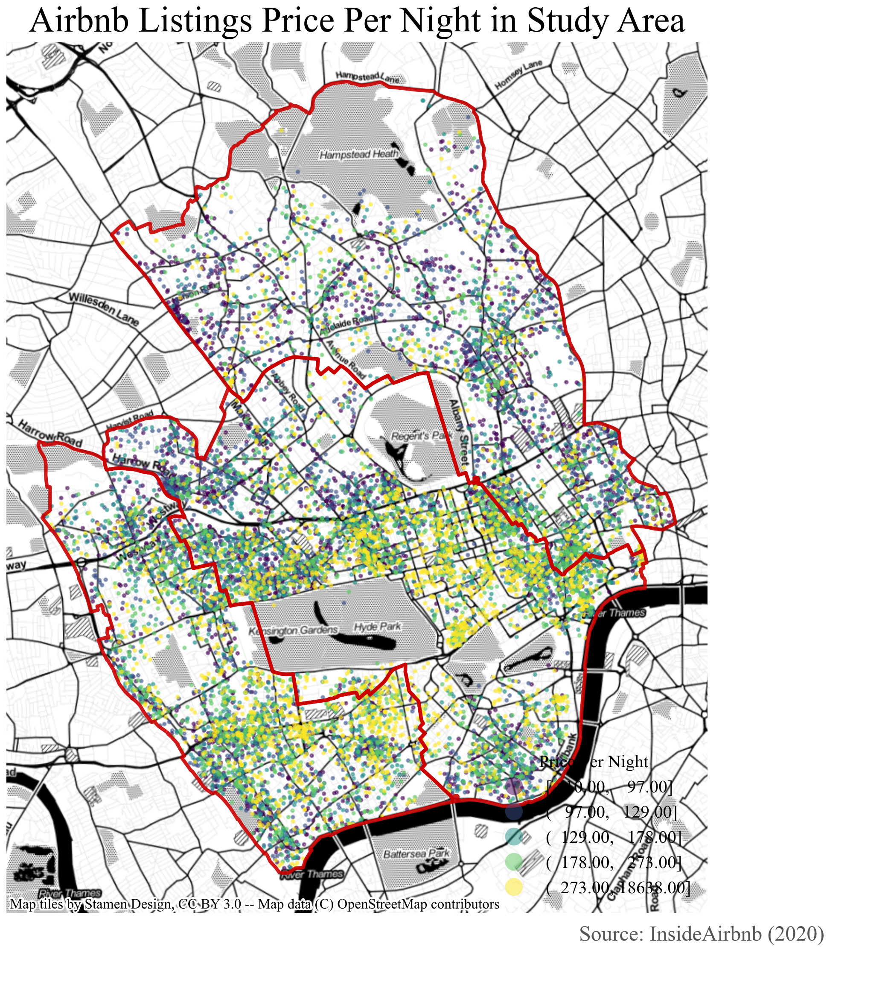

In [287]:
# plot the price distribution
fig,ax = plt.subplots(figsize=(10,9),dpi=300)
gdf_bnb_CetRt.sort_values('price').plot('price',scheme='Quantiles',cmap='viridis',legend=True,
                                          marker=".",alpha=.5,markersize=10,ax=ax,zorder=1,
                                          legend_kwds={'loc':'lower right'}) 
# Ref: https://geopandas.org/reference.html?highlight=plot#geopandas.GeoDataFrame.plot

gdf_stdArea.plot(edgecolor=(0.8, 0, 0, 0.9), facecolor='none', linewidth=2, ax=ax,zorder=2)

ctx.add_basemap(ax,crs="epsg:27700",source=ctx.providers.Stamen.Toner)

ax.set_title('Airbnb Listings Price Per Night in Study Area', fontdict={'fontsize':'20', 'fontweight':'3'})
ax.axis('off')

a = ax.annotate('Source: InsideAirbnb (2020)',
                xy=(0.925, 0.055), xycoords='figure fraction', 
                horizontalalignment='right', verticalalignment='bottom',
                fontsize=12, fontweight=4, color='#555555')  #add source info on the image itself
a.set_bbox(dict(facecolor='white', alpha=0.95, edgecolor='white'))
ax.get_legend().set_title("Price Per Night")  #set the legend title

## Calculate spatial attributes of Airbnb listings

* manipulate POI data 
    * filter by study area using bounding box (bigger than study area to allow buffer analysis)
    * drop useless cols 
    * drop POIs with low position accuracy 
    * get POI group by class number of each POI

In [261]:
# Ref: https://gis.stackexchange.com/questions/266730/filter-by-bounding-box-in-geopandas
xmin, ymin, xmax, ymax = gdf_stdArea.total_bounds

gdf_poi_Cet = gdf_poi.cx[xmin-1000:xmax+1000, ymin-1000:ymax+1000] # +- 1000 to create a bigger bbx for buffer analysis

gdf_poi_Cet.shape, gdf_poi.shape

((89979, 25), (490626, 25))

In [262]:
gdf_poi_CetC =gdf_poi_Cet[["ref_no","pointx_class","pos_accuracy","postcode","geometry"]]

gdf_poi_CetCPa = gdf_poi_CetC[gdf_poi_CetC.pos_accuracy<=2].drop(columns=["pos_accuracy"],axis=1).reset_index(drop=True)

gdf_poi_CetCPa['group'] = gdf_poi_CetCPa.apply(lambda x:int(re.findall(r"(\d+)\d{6}$",str(x["pointx_class"]))[0]), axis=1)

* How to find the nearest POI and distance to the nearest POI for each airbnb point **Opt2**
    1. Calculate the distance between a airbnb point and all POIs points
    2. Create a buffer to filter the nearby POIs, and then compute the distance and sort it to get the nearest distance
        * setting of buffer distance is important
    3. Use Voronoi diagram to partition the plane into regions, then find the region each listings belongs to
    * shapely.ops.nearest_points  return the index of the nearest point 
    * geopandas point.distance
* Which distance metric should be used? **Opt2**
    1. Manhattan distance
    2. Euclidean distance
    3. route distance (osmnx
    * made some attempts with road network data, but the calculation is too complicated

In [263]:
def get_nearstpoi(pnt_bnb, gdf_poi, buf_dis = 100):
    # create buffer area
    buffer = pnt_bnb.buffer(buf_dis)
    
    # get pois in buffer area
    buf_pois = gdf_poi[gdf_poi.within(buffer)] 
    
    if buf_pois.shape[0]>0:
        # get distanace to each pois in buffer area
        buf_pois["dis_to_pnt"] = buf_pois.apply(lambda x: pnt_bnb.distance(x.geometry),axis=1)
        
        # sort by distance 
        buf_pois_sort = buf_pois.sort_values(by="dis_to_pnt").reset_index()
        return buf_pois_sort.loc[0,["dis_to_pnt","ref_no"]].values
    else:
        # no poi in buffer area 
        return (None,None)

def plot_pois(gdf_poi,gdf_stdArea,title='Bus transport POIs'):
    '''
    plot to check the spatial distribution of pois
    '''
    f,ax = plt.subplots(figsize=(15,9),dpi=300)
    gdf_poi.plot(marker='*', markersize=4,ax=ax)
    ctx.add_basemap(ax,crs="epsg:27700",source=ctx.providers.Stamen.Toner)
    gdf_stdArea.plot(edgecolor=(0.8, 0, 0, 0.9), facecolor='none', linewidth=2, ax=ax)
    ax.set_title(title)
    return f,ax

def get_nd(gdf_bnb,gdf_poi,paraname = 'Nearest_Bus',buf_dis=1000):
    '''
    calculate the distance to nearest poi for each airbnb point in the gdf bnb, return a dataframe of two columns
    col1 : Dis_paraname: distance
    col2 : RefN_paraname: reference number of the nearest poi
    
    :param gdf_bnb:  airbnb geodataframe
    :param gdf_poi:  poi geodataframe
    :param paraname: col name of variable
    :param buf_dis:  buffer distance to filter poi
    :return df_bnb_nd: dataframe
    ''' 
    gdf_bnb = gdf_bnb.copy()
    gdf_bnb[paraname] = gdf_bnb.apply(lambda row: get_nearstpoi(row.geometry,gdf_poi,buf_dis = buf_dis), axis=1)

    ## distance to nearest bus transport poi
    gdf_bnb[f"Dis_{paraname}"] = gdf_bnb.apply(lambda row: row[paraname][0],axis=1)
    
    ## reference number of nearest bus transport poi
    gdf_bnb[f"RefN_{paraname}"] = gdf_bnb.apply(lambda row: row[paraname][1],axis=1)
    
    df_bnb_nd = gdf_bnb[[f"Dis_{paraname}",f"RefN_{paraname}"]].dropna(axis=0,how='any')
    df_bnb_nd[f"Dis_{paraname}"] = df_bnb_nd.apply(lambda row: row[f"Dis_{paraname}"]+0.1,axis=1)
    return df_bnb_nd

## Q: how to create multiple columns by `apply` 
# https://stackoverflow.com/questions/16236684/apply-pandas-function-to-column-to-create-multiple-new-columns

We can calculate the nearest distance to different POIs as attributes of Airbnb listings with this defined function. Several aspects were considered, including:
* nearest distance to bus transport
    * 10590732 Bus stops  
    * 10590759 Hail and ride zones  
* nearest distance to Recreational(Parks etc.)
    * 03180253 Country and National Parks
    * 03180254 Picnic areas
    * 0318**** ...
* nearest distance to metro
    * 10570794 London Underground entrances
    * 10570756 Tram, metro and light railway stations and stops
    * 10570761 Underground network stations
* nearest distance to tourism
    * 03200266 Theme and adventure parks
    * 0320**** ....
* nearest distance to Pubs, bars
    * 
* nearest distance to Attractions

### Bus transport

In [264]:
gdf_poi_CetBus = gdf_poi_CetCPa[gdf_poi_CetCPa["pointx_class"].isin([10590732,10590759])]

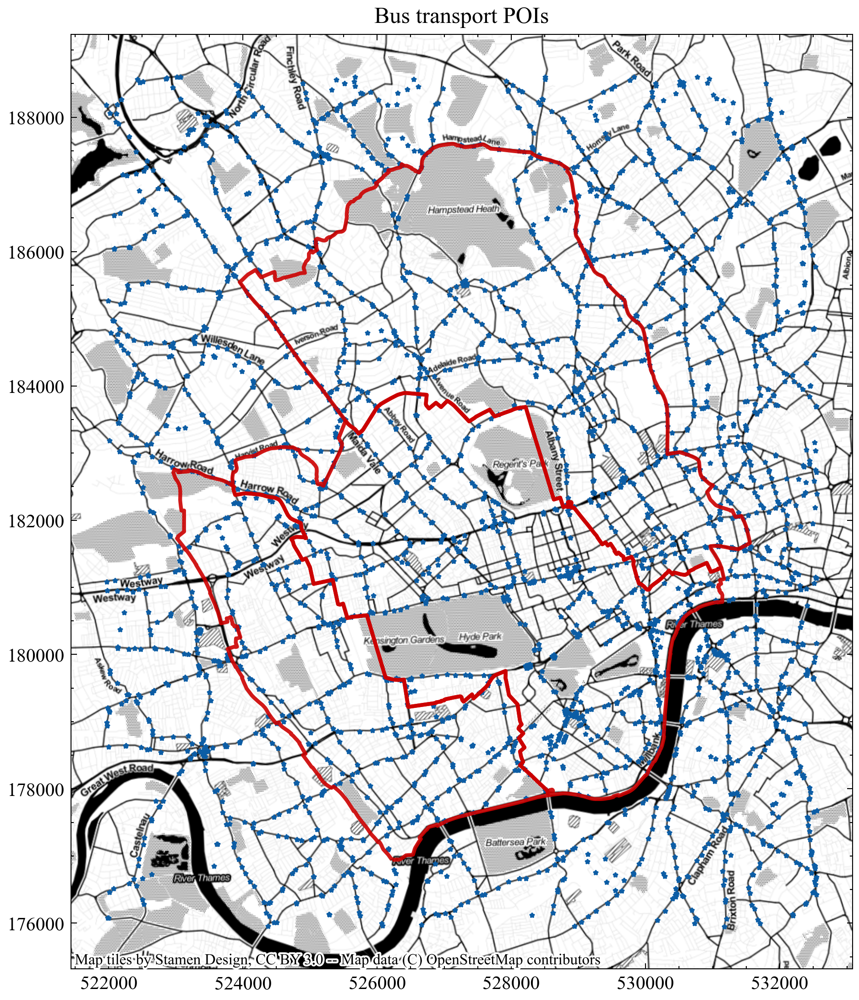

In [265]:
f,ax = plot_pois(gdf_poi_CetBus,gdf_stdArea,title='Bus transport POIs') ## check spatial distribution
df_Bus_nd =  get_nd(gdf_bnb_CetRt, gdf_poi_CetBus, paraname = 'Nearest_Bus', buf_dis=500)

(array([ 52., 163., 260., 310., 329., 333., 369., 328., 296., 260., 239.,
        232., 193., 158., 134., 106., 110.,  91.,  79.,  60.,  55.,  46.,
         32.,  12.,  20.,  22.,   7.,   8.,   9.,   6.,   5.,   4.,   0.,
          1.,   0.,   0.,   1.,   1.,   0.,   2.]),
 array([  0.85117455,  13.02012176,  25.18906896,  37.35801617,
         49.52696338,  61.69591059,  73.8648578 ,  86.03380501,
         98.20275221, 110.37169942, 122.54064663, 134.70959384,
        146.87854105, 159.04748826, 171.21643546, 183.38538267,
        195.55432988, 207.72327709, 219.8922243 , 232.06117151,
        244.23011871, 256.39906592, 268.56801313, 280.73696034,
        292.90590755, 305.07485476, 317.24380196, 329.41274917,
        341.58169638, 353.75064359, 365.9195908 , 378.08853801,
        390.25748521, 402.42643242, 414.59537963, 426.76432684,
        438.93327405, 451.10222126, 463.27116846, 475.44011567,
        487.60906288]),
 <BarContainer object of 40 artists>)

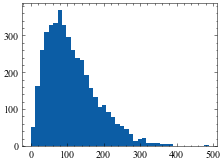

In [266]:
plt.hist(df_Bus_nd["Dis_Nearest_Bus"],bins=40)

* Maximun distance to the nearest bus transport is about 400m, so buffer distance of 500 is enough

### Recreational

In [267]:
gdf_poi_CetRec = gdf_poi_CetCPa[gdf_poi_CetCPa.pointx_class.astype("string").str.startswith("318")]

# f,ax = plot_pois(gdf_poi_CetRec,gdf_stdArea,title='Recreational sites') ## check spatial distribution

df_Rec_nd =  get_nd(gdf_bnb_CetRt, gdf_poi_CetRec, paraname = 'Nearest_Rec', buf_dis=1200)

(array([ 83., 228., 337., 374., 322., 357., 335., 311., 251., 241., 204.,
        169., 152., 140., 100., 103.,  96.,  81.,  76.,  65.,  44.,  29.,
         28.,  35.,  29.,  25.,  17.,   7.,  20.,  13.,  17.,  12.,   8.,
          7.,   7.,   1.,   2.,   6.,   1.,   2.]),
 array([   5.85470844,   35.40109915,   64.94748986,   94.49388057,
         124.04027127,  153.58666198,  183.13305269,  212.6794434 ,
         242.22583411,  271.77222482,  301.31861553,  330.86500624,
         360.41139695,  389.95778765,  419.50417836,  449.05056907,
         478.59695978,  508.14335049,  537.6897412 ,  567.23613191,
         596.78252262,  626.32891332,  655.87530403,  685.42169474,
         714.96808545,  744.51447616,  774.06086687,  803.60725758,
         833.15364829,  862.70003899,  892.2464297 ,  921.79282041,
         951.33921112,  980.88560183, 1010.43199254, 1039.97838325,
        1069.52477396, 1099.07116466, 1128.61755537, 1158.16394608,
        1187.71033679]),
 <BarContainer object

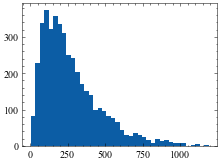

In [268]:
plt.hist(df_Rec_nd["Dis_Nearest_Rec"],bins=40)

### Metro

In [269]:
gdf_poi_CetMetro = gdf_poi_CetCPa[gdf_poi_CetCPa.pointx_class.isin([10570794,10570756,10570761])]

# f,ax = plot_pois(gdf_poi_CetMetro,gdf_stdArea,title='Metro')

df_Metro_nd =  get_nd(gdf_bnb_CetRt, gdf_poi_CetMetro, paraname = 'Nearest_Metro', buf_dis=1200)

(array([ 57., 100., 136., 193., 205., 199., 243., 254., 239., 239., 261.,
        282., 215., 202., 176., 173., 151., 127., 124., 116.,  90.,  96.,
         76.,  61.,  66.,  49.,  38.,  32.,  24.,  22.,  14.,  13.,  15.,
         10.,   6.,   4.,   6.,   3.,   3.,   5.]),
 array([   5.19462821,   34.8563335 ,   64.5180388 ,   94.17974409,
         123.84144939,  153.50315468,  183.16485998,  212.82656527,
         242.48827056,  272.14997586,  301.81168115,  331.47338645,
         361.13509174,  390.79679704,  420.45850233,  450.12020763,
         479.78191292,  509.44361821,  539.10532351,  568.7670288 ,
         598.4287341 ,  628.09043939,  657.75214469,  687.41384998,
         717.07555528,  746.73726057,  776.39896586,  806.06067116,
         835.72237645,  865.38408175,  895.04578704,  924.70749234,
         954.36919763,  984.03090292, 1013.69260822, 1043.35431351,
        1073.01601881, 1102.6777241 , 1132.3394294 , 1162.00113469,
        1191.66283999]),
 <BarContainer object

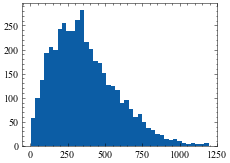

In [270]:
plt.hist(df_Metro_nd["Dis_Nearest_Metro"],bins = 40) ## log normal distribution

### Toursim


In [271]:
gdf_poi_CetTour = gdf_poi_CetCPa[gdf_poi_CetCPa.pointx_class.astype("string").str.startswith("320")]

#f,ax = plot_pois(gdf_poi_CetTour,gdf_stdArea,title='Toursim')
df_Tour_nd =  get_nd(gdf_bnb_CetRt, gdf_poi_CetTour, paraname = 'Nearest_Tour', buf_dis=1000)

(array([179., 386., 476., 475., 442., 386., 343., 335., 276., 187., 166.,
        135.,  97.,  95.,  77.,  56.,  43.,  49.,  37.,  23.,  14.,  18.,
         11.,   6.,   8.,   4.,   4.,   4.,   0.,   1.,   1.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([  1.91048165,  25.51509364,  49.11970563,  72.72431761,
         96.3289296 , 119.93354159, 143.53815358, 167.14276556,
        190.74737755, 214.35198954, 237.95660153, 261.56121351,
        285.1658255 , 308.77043749, 332.37504948, 355.97966146,
        379.58427345, 403.18888544, 426.79349743, 450.39810941,
        474.0027214 , 497.60733339, 521.21194538, 544.81655736,
        568.42116935, 592.02578134, 615.63039333, 639.23500531,
        662.8396173 , 686.44422929, 710.04884128, 733.65345327,
        757.25806525, 780.86267724, 804.46728923, 828.07190122,
        851.6765132 , 875.28112519, 898.88573718, 922.49034917,
        946.09496115]),
 <BarContainer object of 40 artists>)

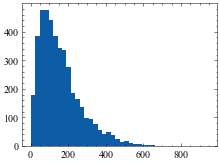

In [272]:
plt.hist(df_Tour_nd["Dis_Nearest_Tour"],bins = 40) ## log normal distribution

### Pubs, bars and inns

In [273]:
gdf_poi_CetBar = gdf_poi_CetCPa[gdf_poi_CetCPa.pointx_class==1020034]

#f,ax = plot_pois(gdf_poi_CetBar,gdf_stdArea,title='Bars')
df_Bar_nd =  get_nd(gdf_bnb_CetRt, gdf_poi_CetBar, paraname = 'Nearest_Bars', buf_dis=1000)

### Body of waters

* Body of waters is a kind of polygon，It's not appropriate to be counted as points on this geographic scale

In [274]:
# gdf_poi_CetWater = gdf_poi_CetCPa[gdf_poi_CetCPa.pointx_class.astype("string").str.startswith("358")]

# #f,ax = plot_pois(gdf_poi_CetWater,gdf_stdArea,title='Waters')
# df_Water_nd =  get_nd(gdf_bnb_CetRt, gdf_poi_CetWater, paraname = 'Nearest_Waters', buf_dis=1000)

### Historical and cultural

In [275]:
gdf_poi_CetHist = gdf_poi_CetCPa[gdf_poi_CetCPa.pointx_class.astype("string").str.startswith("317")]

#f,ax = plot_pois(gdf_poi_CetHist,gdf_stdArea,title='Historical and cultural')
df_Hist_nd =  get_nd(gdf_bnb_CetRt, gdf_poi_CetHist, paraname = 'Nearest_Hist', buf_dis=1000)

(array([ 55., 168., 273., 265., 294., 320., 311., 282., 265., 249., 204.,
        201., 161., 151., 134., 136., 118., 114.,  83.,  81.,  70.,  51.,
         54.,  45.,  49.,  38.,  43.,  22.,  24.,  12.,   8.,  12.,   6.,
          5.,   4.,   4.,   3.,   7.,   3.,   4.]),
 array([  1.49114823,  26.22323741,  50.95532659,  75.68741577,
        100.41950496, 125.15159414, 149.88368332, 174.6157725 ,
        199.34786168, 224.07995087, 248.81204005, 273.54412923,
        298.27621841, 323.00830759, 347.74039677, 372.47248596,
        397.20457514, 421.93666432, 446.6687535 , 471.40084268,
        496.13293187, 520.86502105, 545.59711023, 570.32919941,
        595.06128859, 619.79337778, 644.52546696, 669.25755614,
        693.98964532, 718.7217345 , 743.45382368, 768.18591287,
        792.91800205, 817.65009123, 842.38218041, 867.11426959,
        891.84635878, 916.57844796, 941.31053714, 966.04262632,
        990.7747155 ]),
 <BarContainer object of 40 artists>)

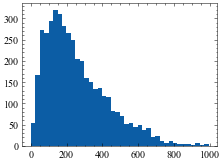

In [276]:
plt.hist(df_Hist_nd["Dis_Nearest_Hist"],bins = 40) ## log normal distribution

## Regression: GWR vs. OLS

In [277]:
## concat all distance data frames to bnb dataframe 
gdf_bnb_Res = pd.concat([gdf_bnb_CetRt,df_Bus_nd, df_Metro_nd, df_Rec_nd, df_Hist_nd, df_Bar_nd,df_Tour_nd],axis=1,join="inner")#.dropna(axis=0, how='any')

gdf_bnb_Res.shape, gdf_bnb_CetRt.shape

((4317, 19), (4335, 7))

In [278]:
gdf_bnb_Res.isnull().sum() ## check if df hava null values

room_type             0
accommodates          0
bedrooms              0
beds                  0
price                 0
number_of_reviews     0
geometry              0
Dis_Nearest_Bus       0
RefN_Nearest_Bus      0
Dis_Nearest_Metro     0
RefN_Nearest_Metro    0
Dis_Nearest_Rec       0
RefN_Nearest_Rec      0
Dis_Nearest_Hist      0
RefN_Nearest_Hist     0
Dis_Nearest_Bars      0
RefN_Nearest_Bars     0
Dis_Nearest_Tour      0
RefN_Nearest_Tour     0
dtype: int64

In [279]:
gdf_bnb_Res_wgs84 = gdf_bnb_Res.to_crs("epsg:4326") ## computation is more efficient in longitude&latitude

### OLS

OLS results are provided in GWR model

In [280]:
# def drop_column_using_vif_(df, thresh=40):
#     '''
#     Calculates VIF each feature in a pandas dataframe, and repeatedly drop the columns with the highest VIF
#     A constant must be added to variance_inflation_factor or the results will be incorrect

#     :param df: the pandas dataframe containing only the predictor features, not the response variable
#     :param thresh: the max VIF value before the feature is removed from the dataframe
#     :return: dataframe with multicollinear features removed
#     '''
#     while True:
#         # adding a constatnt item to the data
#         df_with_const = add_constant(df)

#         vif_df = pd.Series([variance_inflation_factor(df_with_const.values, i) 
#                for i in range(df_with_const.shape[1])], name= "VIF",
#               index=df_with_const.columns).to_frame()

#         # drop the const
#         vif_df = vif_df.drop('const')
        
#         # if the largest VIF is above the thresh, remove a variable with the largest VIF
#         if vif_df.VIF.max() > thresh:
#             # If there are multiple variables with the maximum VIF, choose the first one
#             index_to_drop = vif_df.index[vif_df.VIF == vif_df.VIF.max()].tolist()[0]
#             print(f'Dropping: {index_to_drop}\n VIF_value:{vif_df.VIF.max()}')
#             print("=="*20)
#             df = df.drop(columns = index_to_drop)
#         else:
#             # No VIF is above threshold. Exit the loop
#             break

#     return df

In [281]:
# dft = gdf_bnb_Res_wgs84[['price','accommodates', 'bedrooms', 'beds', 'number_of_reviews', 'Dis_Nearest_Bus',"Dis_Nearest_Metro",
#                        'Dis_Nearest_Rec', 'Dis_Nearest_Hist', 'Dis_Nearest_Bars', 'Dis_Nearest_Tour']]
# dft['log_price'] = dft.apply(lambda x : np.log(x['price']),axis=1)
# dft = dft.drop('price',axis=1)

# corr = dft.corr()
# f, ax = plt.subplots(figsize=(10, 5))
# ax = sns.heatmap(corr, yticklabels=True, annot=True,cmap="YlGnBu",
#                  vmin=-1, vmax=1, xticklabels=False, square=True)
# print("++"*60)

# ## drop
# dft_selected = drop_column_using_vif_(dft.drop('log_price', axis=1),5)
# print(dft_selected.columns)
# print("++"*60)

# model = sm.OLS(endog=dft[["log_price"]], exog=sm.add_constant(dft_selected),hasconst=True).fit()
# print(model.summary())
# print("++"*60)

# ## residual
# fig, ax = plt.subplots(1,2,figsize=(9,3))
# ax[0].scatter(model.fittedvalues, model.resid)
# ax[1].scatter(dft["log_price"],model.fittedvalues)

### GWR model

In [282]:
gdf_bnb_Res_wgs84.columns

Index(['room_type', 'accommodates', 'bedrooms', 'beds', 'price',
       'number_of_reviews', 'geometry', 'Dis_Nearest_Bus', 'RefN_Nearest_Bus',
       'Dis_Nearest_Metro', 'RefN_Nearest_Metro', 'Dis_Nearest_Rec',
       'RefN_Nearest_Rec', 'Dis_Nearest_Hist', 'RefN_Nearest_Hist',
       'Dis_Nearest_Bars', 'RefN_Nearest_Bars', 'Dis_Nearest_Tour',
       'RefN_Nearest_Tour'],
      dtype='object')

In [283]:
## prepare =======
coor = np.column_stack([gdf_bnb_Res_wgs84.geometry.x,gdf_bnb_Res_wgs84.geometry.y])
X = gdf_bnb_Res_wgs84[['accommodates', 'bedrooms', 'number_of_reviews', 'Dis_Nearest_Bus', 'Dis_Nearest_Metro',
                       'Dis_Nearest_Rec', 'Dis_Nearest_Hist', 'Dis_Nearest_Tour']]
y = gdf_bnb_Res_wgs84[['price']]

## standardization ============
X_std = StandardScaler().fit_transform(X)
y_std = StandardScaler().fit_transform(np.log(y)) ## PowerTransformer
print("++"*60)

## model ============
model_GWR = mgwr.gwr.GWR(coor, # coordinates of each sites
                         y_std, # response var
                         X_std,
                         500, # bw 
                         fixed=False,
                         spherical=True, # shperical coordinates
                        )

results_GWR = model_GWR.fit()

print(results_GWR.summary())
print("++"*60)

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Model type                                                         Gaussian
Number of observations:                                                4317
Number of covariates:                                                     9

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           3555.271
Log-likelihood:                                                   -5706.530
AIC:                                                              11431.059
AICc:                                                             11433.110
BIC:                                                             -32504.050
R2:                                                                   0.176
Adj. R2:                                                              0.175

Variable       

* 价格应该取对数吗 
    * 租金价格不一定需要
    * 分布
    * 模型r2更高
* TODO: log distance

In [40]:
# gwr_selector = mgwr.sel_bw.Sel_BW(coor, # coordinates of each sites
#                                   y_std,# response var
#                                   X_std,
#                                   kernel = 'gaussian',
#                                   fixed=True,
#                                   spherical=True,# independent var
#                                  )
# # https://mgwr.readthedocs.io/en/latest/generated/mgwr.gwr.GWR.html#mgwr.gwr.GWR

# # https://pysal.org/notebooks/model/mgwr/MGWR_Georgia_example.html
# gwr_bw = gwr_selector.search(bw_min=2,criterion='AICc')

### GWR weight  plot

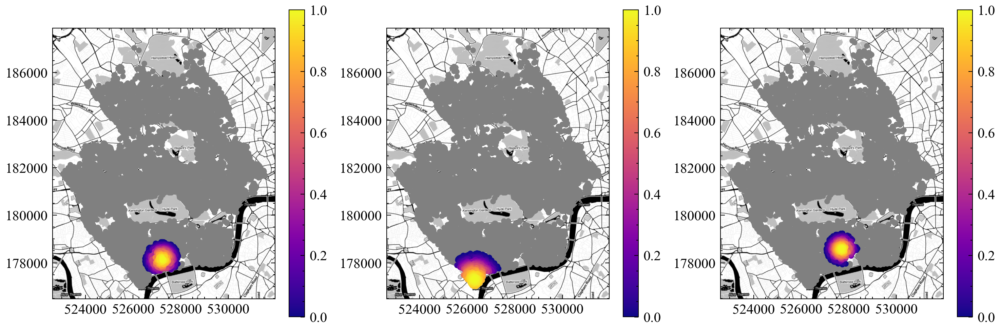

In [41]:
## plot the spatial local weight matrix of first three points

# results_GWR.W
# https://mgwr.readthedocs.io/en/latest/generated/mgwr.gwr.GWRResults.html#mgwr.gwr.GWRResults

fig,ax = plt.subplots(1,3,figsize=(12,4),dpi=300)

for i, ax_ in enumerate(ax):
    gdf_bnb_Res.plot(color="grey",marker=".",ax=ax_)
    (gdf_bnb_Res.assign(localweight=results_GWR.W[i]).query('localweight>0')
     .sort_values('localweight').plot('localweight',ax=ax_,cmap='plasma',marker='.',legend=True))
    
    ctx.add_basemap(ax_,crs="epsg:27700",source=ctx.providers.Stamen.Toner,attribution=False)

### local R2 plot

Text(0.5, 1.0, 'Local $R^2$ of the GWR model')

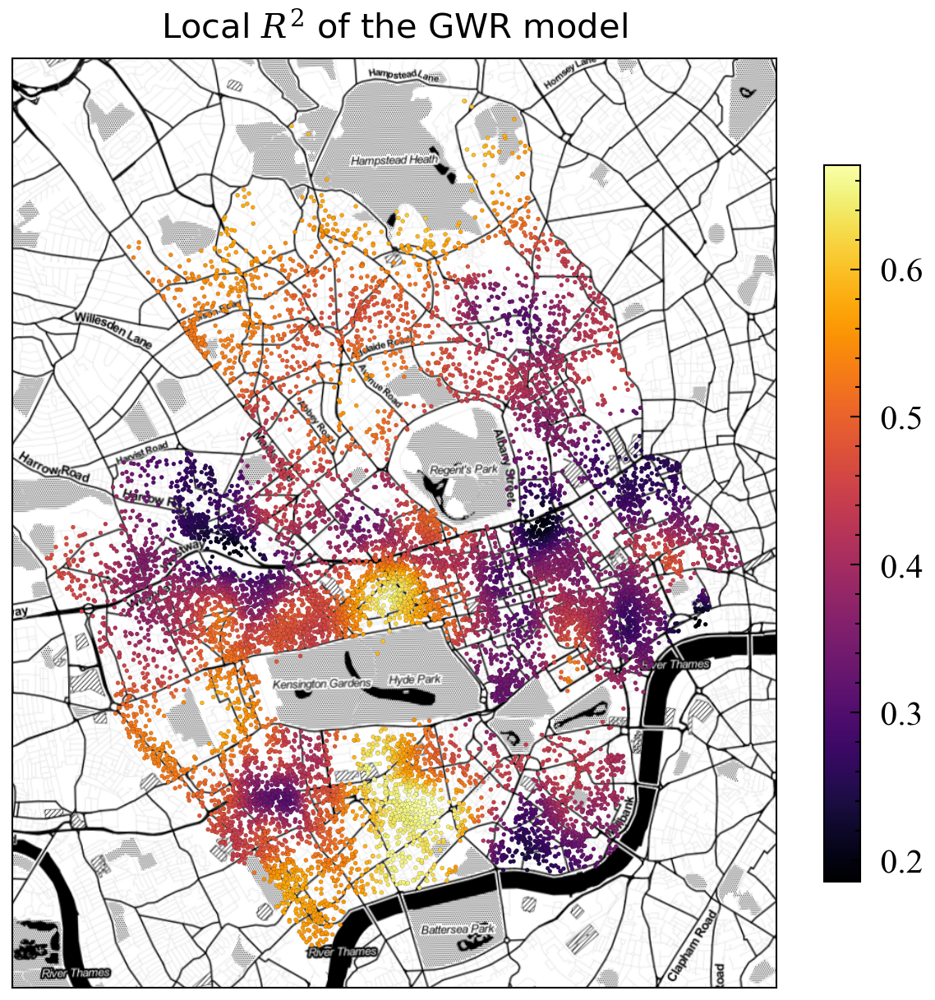

In [225]:
f,ax = plt.subplots(figsize=(5,5.5),dpi=300,
                    subplot_kw=dict(aspect="equal"))

## plot local r2 =================================
df_GWR_Res.plot('r2',ax=ax,cmap='inferno',
                edgecolors="k", linewidths=0.03,marker='o',markersize=1.5,
                legend=True,legend_kwds={'shrink':0.7,'format':'% .1f'})

ctx.add_basemap(ax,crs="epsg:27700",source=ctx.providers.Stamen.Toner,attribution=False,reset_extent=True)
ax.tick_params(axis=u'both',which=u'both',labelright=0,labelleft =0,labelbottom=0,left=0,bottom=0,top=0,right=0,labelsize=8) ## set labels and axis tick
ax.set_title("Local $R^2$ of the GWR model", font = font_subtitle)

### GWR standardized residuals plot

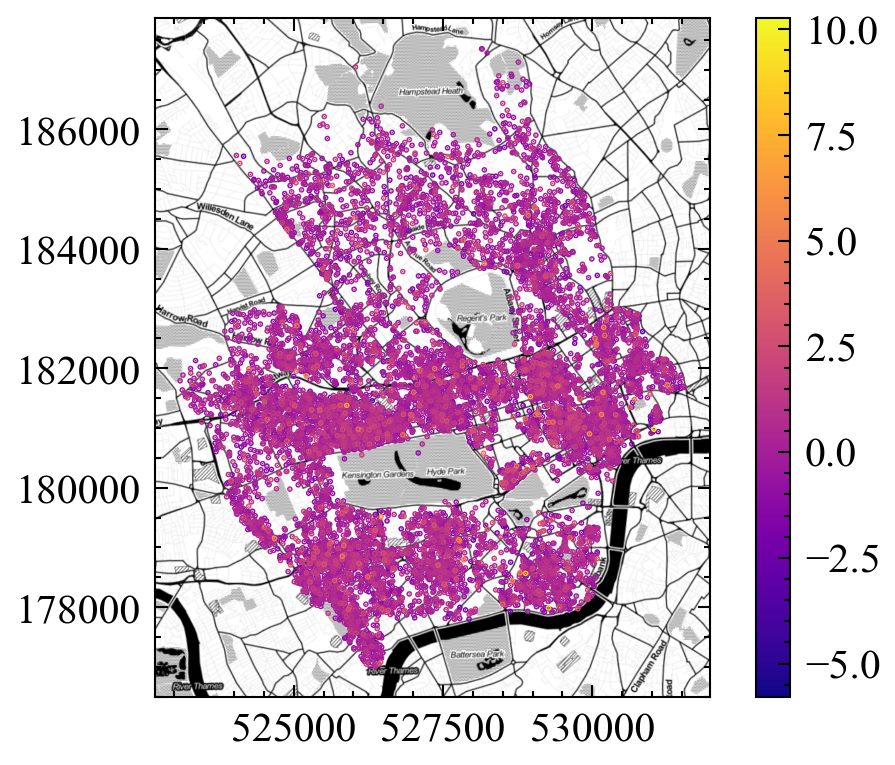

In [173]:
f,ax = plt.subplots(figsize=(4,3),dpi=300)

listings_tmp = gdf_bnb_Res.assign(res = results_GWR.std_res) ## standardized residuals

listings_tmp.sort_values("res").plot('res',cmap='plasma', markersize=0.5, marker='.',ax=ax,legend=True)

ctx.add_basemap(ax,crs="epsg:27700",source=ctx.providers.Stamen.Toner,attribution=False,reset_extent=True)

In [223]:
## TODO: Compare with residuals of OLS

### GWR result parameters correlation

In [216]:
df_coef = pd.DataFrame(results_GWR.filter_tvals(alpha=0.05), ## significance level 0.05
                       columns = ['Coef_Constant','Coef_accommodates', 'Coef_bedrooms', 'Coef_beds', 'Coef_number_of_reviews', 
                       'Coef_Nearest_Bus', 'Coef_Nearest_Metro','Coef_Nearest_Rec', 'Coef_Nearest_Hist', 'Coef_Nearest_Bars', 
                       'Coef_Nearest_Tour']).assign(r2=results_GWR.localR2)

df_coef.index = gdf_bnb_Res.index

df_GWR_Res = pd.concat([gdf_bnb_Res,df_coef],axis=1) ## concat airbnb df with coefficients df

## df_GWR_Res.to_csv("df_GWR_Res.csv",index=True) ## save results

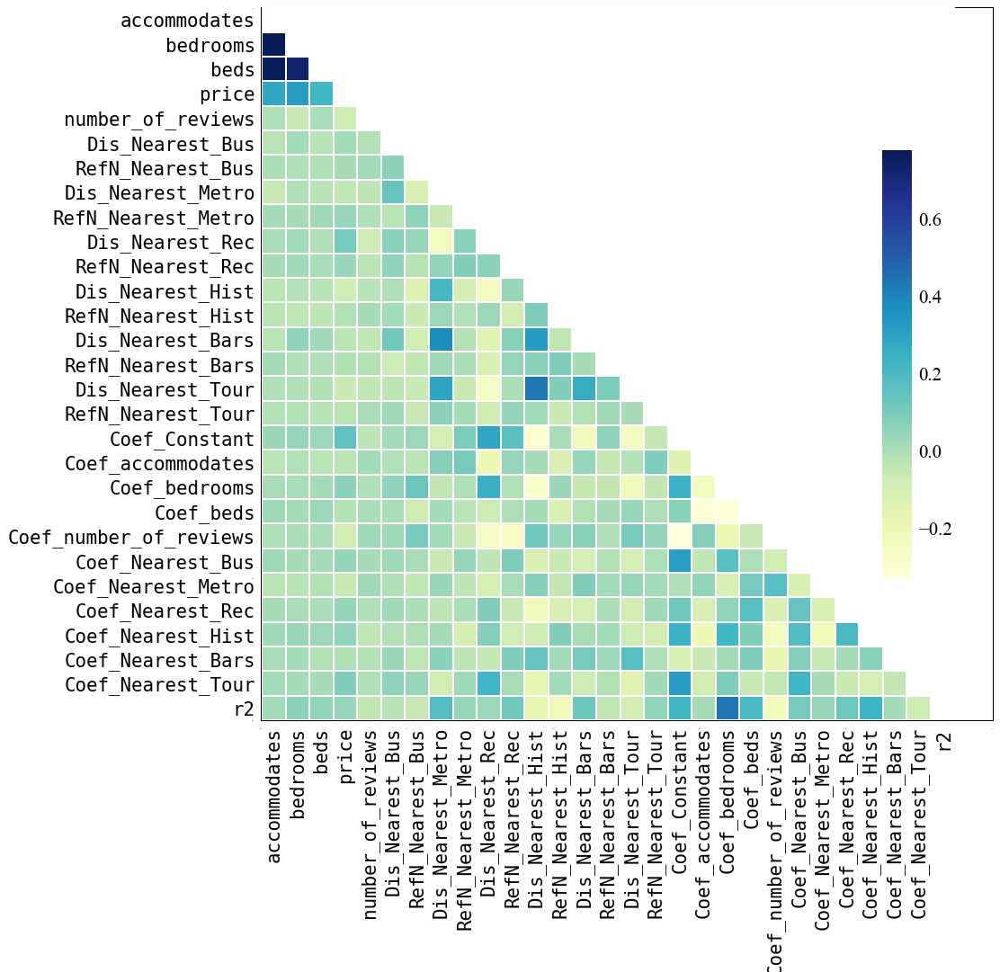

In [221]:
fig,ax3 = plt.subplots(figsize=(7,7),dpi=150)
ax3.tick_params(axis=u'both', which=u'both',length=0,labelsize=0)
ax3h = ax3.inset_axes([0, 0, 0.95, 1])
ax3h.tick_params(axis=u'both', which=u'both',length=0,labelsize=10)
ax3x = ax3.inset_axes([0.85, 0.2, 0.04, 0.6])
ax3x.tick_params(axis=u'both', which=u'both',length=0,labelsize=10)

mask = np.zeros_like(df_GWR_Res.corr())
mask[np.triu_indices_from(mask)] = True
ax3h = sns.heatmap(df_GWR_Res.corr(),mask=mask,square=True,annot=False,fmt="> 0.1f", linewidths=.5, ax=ax3h,yticklabels=1, xticklabels=1,
             cmap="YlGnBu",cbar_ax=ax3x)

labels = ax3h.get_xticklabels() + ax3h.get_yticklabels()
_ = [label.set_fontname('monospace') for label in labels]

### GWR local coefficients 

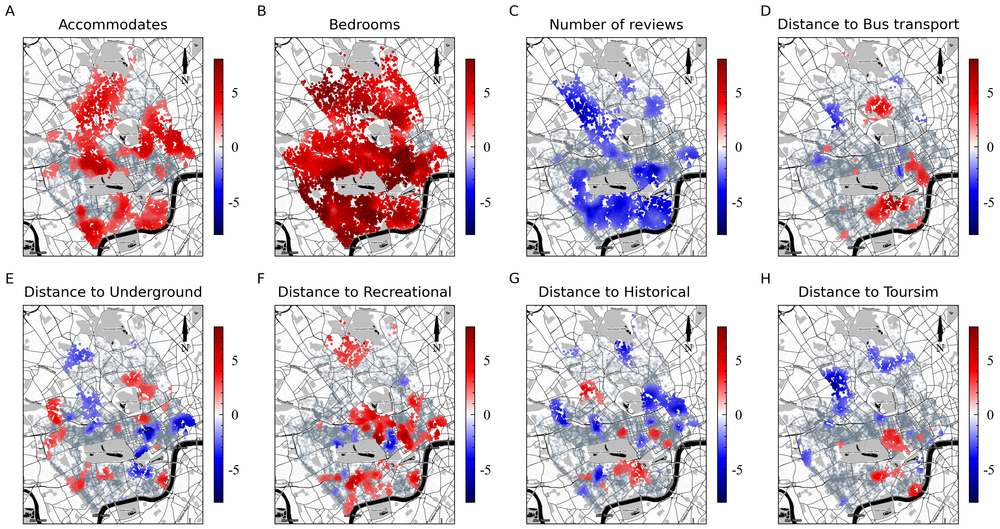

In [207]:
font_subtitle = {'family' : 'sans-serif','weight' : 'normal','size'   : 10}
font_title = {'family' : 'sans-serif','weight' : 'normal','size'   : 15}

f,ax = plt.subplots(2,4,figsize=(10,5.5),dpi=300,
                    subplot_kw=dict(aspect="equal"))  ## same scaling from data to plot units for x and y
ax = ax.flatten()

# variables = ['Constant','accommodates', 'bedrooms', 'beds', 'number_of_reviews', 
#              'Coef_Nearest_Bus', 'Dis_Nearest_Metro','Coef_Nearest_Rec', 'Coef_Nearest_Hist', 'Coef_Nearest_Bars', 
#             'Coef_Nearest_Tour']
## drop some variables
variables = ['Coef_accommodates', 'Coef_bedrooms', 'Coef_number_of_reviews', 
             'Coef_Nearest_Bus', 'Coef_Nearest_Metro','Coef_Nearest_Rec', 
             'Coef_Nearest_Hist', 'Coef_Nearest_Tour']

subtitles = ['Accommodates', 'Bedrooms', 'Number of reviews', 'Distance to Bus transport',
             "Distance to Underground", 'Distance to Recreational','Distance to Historical', 'Distance to Toursim']

## plot local coefs  =================================
for i, var in enumerate(variables):
    
    ## plot non-significant coefs
    df_GWR_Res[df_GWR_Res[var] == 0].plot(color='slategrey',marker='.',markersize=1,ax=ax[i],alpha=0.2)
    
    ## plot significant coefs
    df_GWR_Res[df_GWR_Res[var] != 0].sort_values(var).plot(var,cmap='seismic',ax=ax[i],
                                                       edgecolors="k", linewidths=0.03,marker='o',markersize=3,
                                                       vmin=-8, vmax=8, legend=True,
                                                       legend_kwds={'shrink':0.7,'format':'% d'})
    
    ctx.add_basemap(ax[i],crs="epsg:27700",source=ctx.providers.Stamen.Toner,attribution=False,reset_extent=True)
    
    ax[i].tick_params(axis=u'both',which=u'both',labelright=0,labelleft =0,labelbottom=0,left=0,bottom=0,top=0,right=0,labelsize=8) ## set labels and axis ticks
    ax[i].set_title(subtitles[i],font = font_subtitle)
    
    ax[i].text(-0.1,1.1,"ABCDEFGH"[i],font=font_subtitle, transform=ax[i].transAxes)
    
    ## add north arrow
    x, y, arrow_length = 0.9, 0.95, 0.15
    ax[i].annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
                   arrowprops=dict(facecolor='black', width=1.5, headwidth=3),
                   ha='center', va='center', fontsize=8, xycoords=ax[i].transAxes)
    ## TODO: add scalebar 
    
plt.tight_layout()

f.savefig("Fig_1.GWR_local.png",dpi=400)

* Reference
    * https://methods.sagepub.com/dataset/howtoguide/geographically-weighted-regression-berlin-districts-2018-python
    * https://pysal.org/notebooks/model/mgwr/MGWR_Georgia_example.html
    * https://mgwr.readthedocs.io/en/latest/generated/mgwr.gwr.GWRResults.html
    * https://geographicdata.science/book/notebooks/12_feature_engineering.html#
* Limitations 
    * cut by boundries

TODO: Clustering coefs

------------------

# Executive Briefing.

## Executive Summary

This report discusses the impact of different variables on the price of Airbnb listings in London using a linear model (OLS) and a geographically weighted regression (GWR). The results show that the GWR model has higher accuracy than the OLS model. The effect of listings' structural variables had either a positive or negative impact on price, with the Number of bedrooms having the most considerable influence than other variables. We also found spatial heterogeneity in the effect of listings location variables, with the direction and extent of the impact varying across regions. These findings can provide implications for stakeholders such as Airbnb hosts to understand market conditions better and develop appropriate pricing strategies.

## Review of the evidence

The widespread popularity of peer-to-peer accommodation platforms such as Airbnb has changed the way people travel(Chica-Olmo, González-Morales, and Zafra-Gómez, 2020), as well as the hospitality and tourism industries(Pizam, 2014). For such a platform that attracts customers to choose accommodation through competitive pricing(Kiatkawsin, Sutherland, and Kim, 2020), the host's pricing strategy plays a crucial role. Numerous studies have explored the prices of commercial P2P APs and their factors; the most prevalently adopted methods to investigate factors affecting Airbnb listing prices in current studies is the regression model and, in particular, the hedonic price model (Jim and Chen, 2010). And for structure factors, Kwok and Xie （2019) found that the impact of review ratings is largely positive,  Magno, Cassia and Ugolini（2018) found that the number of reviews negatively affects. For location variables, Gibbs et al.(2018) conclude that the distance to the city center negatively affects the listing performance, as well as the distance to relevant destination attractions, such as convention centers (Zhang et al., 2017), general points of interest (Chica-Olmo et al., 2020), and tourist attractions (Cai et al., 2019). These global regression models ignore the existence of local variables and explore the relationship between only one independent variable and a set of dependent variables (Zhang et al., 2011), masking the relationship's spatial heterogeneity. This study aims to adopt a GWR model to explore the spatial variation in the relationship between Airbnb listing prices and their price determinants.  

## Analysis

This report chose the three London boroughs with the highest Airbnb listings density as the study area. We obtained data of 12,213 Airbnb listings from inside Airbnb. This dataset includes the main structural attributes(such as the Number of bedrooms, etc.) and listings' prices. We then downloaded the POI data for London from digimap, containing nearly 90,000 poi data in 52 categories and over 600 classes, and calculated the distance to nearest bus transport, underground, recreational parks, historical sites, and toursim sites for each listing as location attributes of listings. We used price as the dependent variable and structural variables and location variables as independent variables in regression analyses using OLS and GWR models, respectively.

The results of the OLS model and the GWR model are presented in Table 1. The OLS model is overall significant and explains 38.3% of the total variation in listings prices within the study area. Based on the OLS residuals' spatial distribution, it is evident that the overall model has a high degree of spatial autocorrelation. Although the model's evaluation metrics indicate that the regression results of OLS are biased compared to the GWR model, the advantage of OLS is that it can reflect the global effect of the variables. The GWR model developed in this report is statistically significant in that it explains 48% of the total variation in Airbnb listings prices. The residuals also decreased from 7503 to 6062 compared to the results of the OLS model.

### Global effects of variables on listings price

In terms of listings structure variables, results from OLS models show that the Number of bedrooms has a more significant influence on price performance than any listings structure variables. The Number of bedrooms' coefficient is 0.435, which means one unit increase in the Number of bedrooms will lead to a 43.5% increase in price. Accommodates' coefficient is much smaller, suggesting that users will tend to pay for listings with more bedrooms when they have a certain number to accommodate. Interestingly the coefficient of Number of reviews is negative; this implies that the lower the listing price, the more frequently it is likely to be rented and the higher the Number of reviews.

Regarding listings location variables, distance to public transport and recreational parks has a negative effect on price; specifically, the further away the listings are from these places, the higher the price will be, with the coefficient of Distance to Recreational being the most pronounced, at 0.164, which means that one unit increase in the Distance to Recreational will lead to 16.4% increase in Airbnb listing price. This may be because this report's analysis focuses on the inner city, where open spaces tend to be noisier. However, the increase in distance to historical sites and to tourist destinations shows a positive effect on listings prices; for example, the coefficient of Distance to Tourism is 0.085, which means one unit increase in distance to tourist destinations will lead to an 8.5% decrease in listings price. It suggests a significant externality effect of tour location on Airbnb listings price, which may be related to the user demand of Airbnb users.  In terms of significance test probability values, all variables showed high significance except Distance to Underground.

Results of the GWR model are shown in Tables 1.C. The coefficients estimated from the local GWR model indicate the complicated relationship between listings prices and the various influencing variables. Each variable has a varying impact on listings prices depending on location, with some variables such as Number of bedrooms consistently having a positive effect on prices to varying degrees. Others have a different, either positive or negative, impact on listings prices in a particular location.

<center><b>Table 1:  </b>Results of OLS and GWR model</center>

<center><b>Table 1.A  </b>Model accuracy comparison between OLS and GWR</center>

| Model |   R2  | adjusted R2 |  AIC  | Residual |
|:-----:|:-----:|:-----------:|:-----:|:--------:|
|  OLS  | 0.383 |    0.383    | 28667 |   7503   |
|  GWR  | 0.502 |    0.480    | 27090 |   6062   |


<center><b>Table 1.B </b>Coefficients of OLS model estimation</center>

| Variable                  |  Est.  |   SE  | t(Est/SE) | p-value |
|---------------------------|:------:|:-----:|:---------:|:-------:|
| Constant                  |  0.000 | 0.007 |   0.000   |  1.000  |
| Accommodates              |  0.141 | 0.011 |   12.348  |  0.000  |
| Bedrooms                  |  0.435 | 0.011 |   37.973  |  0.000  |
| Number of reviews         | -0.084 | 0.007 |  -11.663  |  0.000  |
| Distance to Bus transport |  0.022 | 0.007 |   3.050   |  0.002  |
| Distance to Underground   |  0.001 | 0.008 |   0.184   |  0.854  |
| Distance to Recreational  |  0.164 | 0.008 |   21.546  |  0.000  |
| Distance to Historical    | -0.082 | 0.008 |  -10.229  |  0.000  |
| Distance to Toursim       | -0.085 | 0.008 |  -10.301  |  0.000  |

<center><b>Table 1.C </b>Coefficients of GWR model estimation</center>

| Variable                    |  Mean  |  STD  |   Min  | Median | Max   |
|:---------------------------:|:------:|:-----:|:------:|:------:|-------|
| Constant                    |  0.029 | 0.332 | -0.648 | -0.006 | 1.527 |
| Accommodates                |  0.141 | 0.111 | -0.172 |  0.143 | 0.450 |
| Bedrooms                    |  0.429 | 0.141 |  0.002 |  0.423 | 0.780 |
| Number of reviews           | -0.091 | 0.074 | -0.390 | -0.076 | 0.091 |
| Distance to Bus transport   |  0.018 | 0.077 | -0.226 |  0.009 | 0.398 |
| Distance to Underground     | -0.013 | 0.152 | -0.848 | -0.008 | 0.422 |
| Distance to Recreational    |  0.077 | 0.165 | -0.512 |  0.085 | 0.624 |
| Distance to Historical      | -0.012 | 0.163 | -0.542 | -0.009 | 0.620 |
| Distance to Toursim         | -0.006 | 0.107 | -0.343 | -0.016 | 0.499 |

### Local variation in the effects of variables

The spatial distribution of the coefficients of the different variables is shown in Figure 1, where there is significant spatial heterogeneity in the variables across regions, which further suggests that the GWR model is applicable to studying the impact variables on Airbnb's listings price. As can be seen from the figure, the impact of the listing's structural variable has either a positive or negative effect on the price, with only spatial differences in the degree of influence. In contrast, the listing's location variable's impact is different in different regions; for example, in Figure 1.D, the nearest distance to the bus transport impacts listings prices positively in some areas and negatively in other areas.

Of the three listings structural variables, the coefficient on Number of bedrooms is significant and positive for almost all sites (Fig 1.B), and Figure 1.C illustrates that the Number of reviews significantly negatively correlates listing prices mainly for some areas in the south. Of the five listings location variables, the effects of distance to bus transport and underground vary with location. For example, in areas close to Victoria Station, prices are higher the further away from the bus transport and lower the further away from the underground. Indicating Airbnb users in this area prioritises using underground transport more when considering renting a room and staying away from potentially noisy bus transport stations.

As can be seen in Figure 1.F, distance to recreational parks has a negative impact on listings prices in most areas; the greater the distance to recreational parks, the higher the price. In contrast, in some areas, such as listings near the Royal Academy of Arts, recreational parks' impact is positive. This difference may be due to some environmental quality differences in the closest parks. The effect of distance to the nearest historic sites and tourist attractions on listings prices is spatially consistent, with similar areas of significant impact. For example, for listings near Buckingham Palace, the greater the distance to the nearest historical site or tourist attraction, the higher the listings price.

<img src="https://github.com/AdamZhou3/London_Airbnb/blob/main/Fig_1.GWR_local.png?raw=true" width="2400">

<b>Fig.1 </b>The spatial distributions of parameter's coefficients. Each pane shows the value of the corresponding parameter estimate in every site. Sites, where an estimate is not significant in the pane are colored gray; all colored sites for the parameters achieve statistical significance in their effects.

## Conclusion

In conclusion, we have three main findings. Firstly, we compare the results of the OLS and GWR models. Our results validate that both listings prices and their influences variables have nonstationarity in space. Therefore the GWR model is better suited to explain the spatial variation in listings prices. Secondly, we find that the effects of the structural variables of listing have either a positive or negative impact on price, with only spatial differences in the degree of influence. The Number of bedrooms has the most extensive and broadest impact, with an increase in the Number of bedrooms leading to a 43.5% increase in house prices. Thirdly, we find that the effects of the listings' location variable on prices are spatially heterogeneous, with the direction and extent of the impact varying across regions. Moreover, there may be substitution relationships between different location variables; for example, when renting a house in some areas, people tend to prefer those closer to the bus transport and further from the underground. In other areas, people tend to do the opposite.

There are also some limitations to this report. 
1. We have only studied three boroughs in London due to data volume limitations. 
2. We have used Euclidean distances to calculate the locational attributes of listings, which may underestimate actual distances' spatial variations. 
3. This report uses Point of interest data to calculate distances. Many urban elements are not suitable to be substituted by points at the geographical scale used in this study, such as water bodies and large buildings. 
4. Due to the authors' limited understanding of London's social context, the spatial variation of coefficients is under-explained.


## References

Brunsdon, C., Fotheringham, A. S. and Charlton, M. E. (2010) ‘Geographically Weighted Regression: A Method for Exploring Spatial Nonstationarity’, Geographical Analysis, 28(4), pp. 281–298. doi: 10.1111/j.1538-4632.1996.tb00936.x.  

Cai, Y. et al. (2019) ‘Price determinants of Airbnb listings: evidence from Hong Kong’, Tourism Analysis, 24(2), pp. 227–242.

Chica-Olmo, J., González-Morales, J. G. and Zafra-Gómez, J. L. (2020) ‘Effects of location on Airbnb apartment pricing in Málaga’, Tourism Management, 77, p. 103981. doi: 10.1016/j.tourman.2019.103981.

Dong, G., Nakaya, T. and Brunsdon, C. (2018) ‘Geographically weighted regression models for ordinal categorical response variables: An application to geo-referenced life satisfaction data’, Computers, Environment and Urban Systems, 70, pp. 35–42. doi: 10.1016/j.compenvurbsys.2018.01.012.

Gibbs, C. et al. (2018) ‘Pricing in the sharing economy: a hedonic pricing model applied to Airbnb listings’, Journal of Travel & Tourism Marketing, 35(1), pp. 46–56.

Jim, C. Y. and Chen, W. Y. (2010) ‘External effects of neighbourhood parks and landscape elements on high-rise residential value’, Land Use Policy, 27(2), pp. 662–670. doi: 10.1016/j.landusepol.2009.08.027.

Jung, H. S. and Yoon, H. H. (2014) ‘Antecedents and consequences of employees’ job stress in a foodservice industry: Focused on emotional labor and turnover intent’, International Journal of Hospitality Management, 38, pp. 84–88. doi: 10.1016/j.ijhm.2014.01.007.

Kiatkawsin, K., Sutherland, I. and Kim, J.-Y. (2020) ‘A Comparative Automated Text Analysis of Airbnb Reviews in Hong Kong and Singapore Using Latent Dirichlet Allocation’, Sustainability, 12(16), p. 6673.

Kwok, L. and Xie, K. L. (2019) ‘Pricing strategies on Airbnb: Are multi-unit hosts revenue pros?’, International Journal of Hospitality Management, 82, pp. 252–259. doi: 10.1016/j.ijhm.2018.09.013.

Magno, F., Cassia, F. and Ugolini, M. M. (2018) ‘Accommodation prices on Airbnb: effects of host experience and market demand’, The TQM Journal.

Pizam, A. (2014) ‘Peer-to-peer travel: Blessing or blight’.

Zhang, Z. et al. (2017) ‘Key factors affecting the price of Airbnb listings: A geographically weighted approach’, Sustainability, 9(9), p. 1635.

Zhang, H. et al. (2011) ‘Modeling hotel room price with geographically weighted regression’, International Journal of Hospitality Management, 30(4), pp. 1036–1043.
